# Regularization : Ridge vs. Lasso 🥊🥊
Ridge and Lasso are two variations of the regularization technique. The difference comes from a slight change in the mathematical expression of the cost function used to train the model. In this exercise, these two regularization srtategies will be compared in order to analyze their respective influence on the model's coefficients. The effect of the regularization strength $\alpha$ will also be studied.

## Importing libraries and loading the dataset

1. Import the usual libraries. Don't forget to import scikit-learn's following model classes:
* LinearRegression
* Ridge
* Lasso

In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import  OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.metrics import r2_score


2. Execute the following line of code to read the dataset directly from our S3

In [2]:
dataset = pd.read_csv("https://full-stack-bigdata-datasets.s3.eu-west-3.amazonaws.com/Machine+Learning+Supervis%C3%A9/R%C3%A9gression+r%C3%A9gularis%C3%A9es/gene+data/data_lasso.csv",)

In [3]:
dataset.head()

,Unnamed: 0.1,Unnamed: 0,gene_0,gene_1,gene_2,gene_3,gene_4,gene_5,gene_6,gene_7,...,gene_20522,gene_20523,gene_20524,gene_20525,gene_20526,gene_20527,gene_20528,gene_20529,gene_20530,target
0,0,sample_0,0.0,2.017209,3.265527,5.478487,10.431999,0.0,7.175175,0.591871,...,8.210257,9.723516,7.220030,9.119813,12.003135,9.650743,8.921326,5.286759,0.0,12.408154
1,1,sample_1,0.0,0.592732,1.588421,7.586157,9.623011,0.0,6.816049,0.000000,...,7.323865,9.740931,6.256586,8.381612,12.674552,10.517059,9.397854,2.094168,0.0,13.414970
2,2,sample_2,0.0,3.511759,4.327199,6.881787,9.870730,0.0,6.972130,0.452595,...,8.127123,10.908640,5.401607,9.911597,9.045255,9.788359,10.090470,1.683023,0.0,13.566183
3,3,sample_3,0.0,3.663618,4.507649,6.659068,10.196184,0.0,7.843375,0.434882,...,8.792959,10.141520,8.942805,9.601208,11.392682,9.694814,9.684365,3.292001,0.0,12.943886
4,4,sample_4,0.0,2.655741,2.821547,6.539454,9.738265,0.0,6.566967,0.360982,...,8.891425,10.373790,7.181162,9.846910,11.922439,9.217749,9.461191,5.110372,0.0,91.307146


3. The two first columns are useless, find a way to get rid of them.

In [9]:
dataset = dataset.drop(dataset.columns[[0,1]], axis=1)

dataset.head()

,gene_0,gene_1,gene_2,gene_3,gene_4,gene_5,gene_6,gene_7,gene_8,gene_9,...,gene_20522,gene_20523,gene_20524,gene_20525,gene_20526,gene_20527,gene_20528,gene_20529,gene_20530,target
0,0.0,2.017209,3.265527,5.478487,10.431999,0.0,7.175175,0.591871,0.0,0.0,...,8.210257,9.723516,7.220030,9.119813,12.003135,9.650743,8.921326,5.286759,0.0,12.408154
1,0.0,0.592732,1.588421,7.586157,9.623011,0.0,6.816049,0.000000,0.0,0.0,...,7.323865,9.740931,6.256586,8.381612,12.674552,10.517059,9.397854,2.094168,0.0,13.414970
2,0.0,3.511759,4.327199,6.881787,9.870730,0.0,6.972130,0.452595,0.0,0.0,...,8.127123,10.908640,5.401607,9.911597,9.045255,9.788359,10.090470,1.683023,0.0,13.566183
3,0.0,3.663618,4.507649,6.659068,10.196184,0.0,7.843375,0.434882,0.0,0.0,...,8.792959,10.141520,8.942805,9.601208,11.392682,9.694814,9.684365,3.292001,0.0,12.943886
4,0.0,2.655741,2.821547,6.539454,9.738265,0.0,6.566967,0.360982,0.0,0.0,...,8.891425,10.373790,7.181162,9.846910,11.922439,9.217749,9.461191,5.110372,0.0,91.307146


## Exploration

4. Print some information about the dataset. Do you notice something unusual ?

In [13]:
shape = dataset.shape

print("Number of row ", shape[0])
print("Number of columns ", shape[1])

# Nombre de ligne inf à nombre de colonne

Number of row  801
Number of columns  20532


5. Make sure there are no missing values at all in the whole dataset

In [22]:
# tester s'il existe des valeurs nulles
# dataset.describe(include='all')
# il n'y pas de valeur nulles
(dataset.isna().sum() / dataset.shape[0])*100
print("\n2. Colonnes avec des nulls:")
print(dataset.columns[dataset.isnull().any()].tolist())


2. Colonnes avec des nulls:
[]


## Preparing the data for machine learning
6. Separate the target from the features

In [20]:
target_variable = "target"

X = dataset.drop(target_variable, axis = 1)
Y = dataset.loc[:,target_variable]
print("Y", Y.head())
print("X", X.head())

Y 0    12.408154
1    13.414970
2    13.566183
3    12.943886
4    91.307146
Name: target, dtype: float64
X    gene_0    gene_1    gene_2    gene_3     gene_4  gene_5    gene_6  \
0     0.0  2.017209  3.265527  5.478487  10.431999     0.0  7.175175   
1     0.0  0.592732  1.588421  7.586157   9.623011     0.0  6.816049   
2     0.0  3.511759  4.327199  6.881787   9.870730     0.0  6.972130   
3     0.0  3.663618  4.507649  6.659068  10.196184     0.0  7.843375   
4     0.0  2.655741  2.821547  6.539454   9.738265     0.0  6.566967   

     gene_7  gene_8  gene_9  ...  gene_20521  gene_20522  gene_20523  \
0  0.591871     0.0     0.0  ...    4.926711    8.210257    9.723516   
1  0.000000     0.0     0.0  ...    4.593372    7.323865    9.740931   
2  0.452595     0.0     0.0  ...    5.125213    8.127123   10.908640   
3  0.434882     0.0     0.0  ...    6.076566    8.792959   10.141520   
4  0.360982     0.0     0.0  ...    5.996032    8.891425   10.373790   

   gene_20524  gene_20525 

7. Make a train/test splitting

In [21]:
print("Dividing into train and test sets...")
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
print("...Done.")
print()

Dividing into train and test sets...
...Done.



### Preprocessing
8. What preprocessings are necessary here ? Apply them to the features

In [28]:
# Comment on fait: d'abord verifier les types de variable: discrete,continue, nominal, ordinal
colonnes_string = dataset.select_dtypes(include=['object']).columns.tolist()
print("Colonnes string:", colonnes_string)

# comme les VA sont des float, alors Standardisation, Normalisation
scaler = StandardScaler()


Colonnes string: []


In [30]:
# Preprocessings on train set
print("Performing preprocessings on train set...")
#print(X_train.head())
X_train = scaler.fit_transform(X_train)
print('...Done.')
type(X_train)
print(X_train[0:5]) # MUST use this syntax because X_train is a numpy array and not a pandas DataFrame anymore
print()

# Preprocessings on test set
print("Performing preprocessings on test set...")
#print(X_test.head())
X_test = scaler.transform(X_test) # Don't fit again !!
print('...Done.')
print(X_test[0:5,:]) # MUST use this syntax because X_test is a numpy array and not a pandas DataFrame anymore
print()

Performing preprocessings on train set...
...Done.
[[-0.20680191 -2.53389798 -0.79848496 ... -0.95178507  1.05385861
  -0.24865145]
 [ 4.86041305 -0.92157257 -1.84423579 ... -0.0571117   0.46829036
  -0.24865145]
 [-0.20680191  0.1561062  -0.79905507 ...  0.22082625 -0.04312397
  -0.24865145]
 [-0.20680191 -0.05116678  1.42287712 ...  1.12211157 -0.99985435
  -0.24865145]
 [-0.20680191  0.64616593  0.29412155 ...  1.14332463 -0.17675639
  -0.24865145]]

Performing preprocessings on test set...


/home/henintsoa/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


...Done.
[[-2.77555756e-18  3.99212487e+00  2.77273025e+00 ...  1.03902550e+01
   7.82832058e+00  6.93889390e-17]
 [-2.77555756e-18  4.03238301e+00  3.54422571e+00 ...  1.02434834e+01
   7.92559004e+00  6.93889390e-17]
 [-2.77555756e-18  4.39391038e+00  5.57809941e+00 ...  9.64496303e+00
   7.69203656e+00  4.71031344e-01]
 [-2.77555756e-18 -4.20496971e-16  2.53234190e+00 ...  9.13499353e+00
   8.32912360e+00  6.93889390e-17]
 [-2.77555756e-18  1.96484219e+00  2.18301004e+00 ...  9.48814140e+00
   3.26196702e+00  6.93889390e-17]]



### Modèle simple
y = β₀ + β₁x₁ + β₂x₂ + β₃x₃ + ...

#### Exemple : Prédire le prix d'une maison
Prix = β₀ + β₁(Surface) + β₂(Chambres) + β₃(Age)
```

Le modèle cherche les **meilleurs coefficients** (β₁, β₂, β₃...) pour prédire `y`.

### Le problème : Overfitting

Parfois, le modèle apprend **trop bien** les données d'entraînement :
- Il mémorise le bruit et les détails inutiles
- Les coefficients deviennent **très grands**
- Mauvaises prédictions sur de nouvelles données

**Exemple visuel :**
```
Données d'entraînement:
    •   •       •
  •   •   •   •   •
-       •   •       •

Modèle sans régularisation (overfitting):
    •̃   •̃       •̃
  •̃   •̃   •̃   •̃   •̃  ← Courbe trop complexe
- ̃       •̃   •̃       •̃

Modèle avec Ridge (bon équilibre):
    •   •       •
  / / / / / / / /  ← Courbe plus lisse
/       /   /       /
```

---

#### 2. Comment Ridge résout ce problème ? 🛡️

Ridge ajoute une **pénalité** pour empêcher les coefficients de devenir trop grands.

##### Fonction de coût

**Régression linéaire classique :**
```
Minimiser : Erreur²
```

**Ridge :**
```
Minimiser : Erreur² + α × (somme des coefficients²)
                       ↑
                   PÉNALITÉ

## Ridge
Let's focus on Ridge regularization. We'll train 3 Ridge regressors with different values of the strength $\alpha$, and analyze the performances as well as the influence on the model's coefficients.

9. Declare an instance of the Ridge class with $\alpha = 1$. Save this instance for later analysis into an object called `ridge1`. Train the model and display its R2-score on train and test sets.

In [31]:
# Perform 3-fold cross-validation to evaluate the generalized R2 score obtained with a Ridge model
# print("3-fold cross-validation...")
# regressor = Ridge()
# scores = cross_val_score(regressor, X_train, Y_train, cv=3)
# print('The cross-validated R2-score is : ', scores.mean())
# print('The standard deviation is : ', scores.std())

# & :penalité

ridge1 = Ridge()
print(ridge1)
ridge1.fit(X_train, Y_train)
# Print R^2 scores
print("R2 score on training set : ", ridge1.score(X_train, Y_train))
print("R2 score on test set : ", ridge1.score(X_test, Y_test))

Ridge()
R2 score on training set :  0.9999999996538701
R2 score on test set :  0.2609886156120057


10. Declare an instance of the Ridge class with $\alpha = 1000000$. Save this instance for later analysis into an object called `ridge2`. Train the model and display its R2-score on train and test sets.

In [32]:
ridge2 = Ridge(alpha=1000000)
print(ridge2)
ridge2.fit(X_train, Y_train)
# Print R^2 scores
print("R2 score on training set : ", ridge2.score(X_train, Y_train))
print("R2 score on test set : ", ridge2.score(X_test, Y_test))

Ridge(alpha=1000000)
R2 score on training set :  0.6372217335752034
R2 score on test set :  0.35767563528754875


11. Declare an instance of the Ridge class with $\alpha=100000000$. Save this instance for later analysis into an object called `ridge3`
. Train the model and display its R2-score on train and test sets.

In [34]:
ridge3 = Ridge(alpha=100000000)
print(ridge3)
ridge3.fit(X_train, Y_train)
# Print R^2 scores
print("R2 score on training set : ", ridge3.score(X_train, Y_train))
print("R2 score on test set : ", ridge3.score(X_test, Y_test))

Ridge(alpha=100000000)
R2 score on training set :  0.015173529447411016
R2 score on test set :  0.013194189353961994


12. How do the scores vary when alpha changes? Can you explain what's happening?

13. Extract the coefficients of each of the three Ridge models, and store them into a DataFrame

In [37]:
data_dict = {
    'Feature': X.columns,
    'Ridge1': ridge1.coef_,
    'Ridge2': ridge2.coef_,
    'Ridge3': ridge3.coef_
            }

coefficients_ridge = pd.DataFrame(data = data_dict)
coefficients_ridge.head()

,Feature,Ridge1,Ridge2,Ridge3
0,gene_0,-0.018817,-0.001181,-0.000022
1,gene_1,-0.003487,-0.001862,-0.000018
2,gene_2,-0.011201,-0.003263,-0.000048
3,gene_3,-0.005925,-0.000533,-0.000004
4,gene_4,-0.005402,0.003480,0.000061


14. Plot the coefficients of the three models in the same figure. What do you notice?

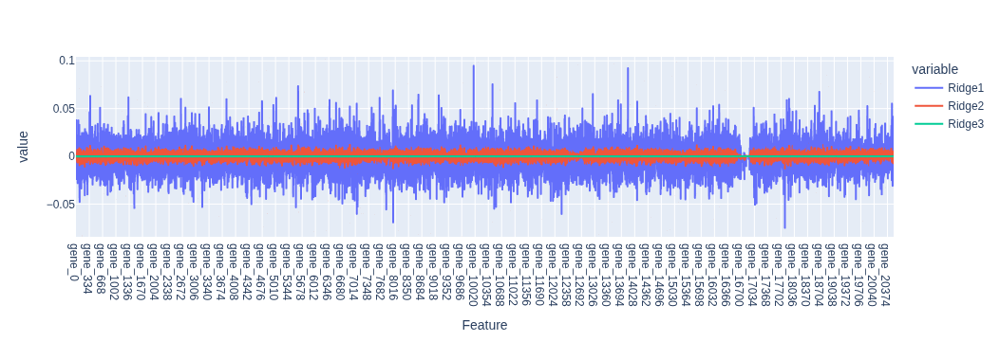

In [38]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

fig = px.line(coefficients_ridge, x = 'Feature', y = ['Ridge1', 'Ridge2', 'Ridge3'])
fig.show()


## Lasso
Let's make the same study with Lasso regularization.

15. Declare an instance of the Lasso class with $\alpha = 1$. Save this instance for later analysis into an object called `lasso1`. Train the model and display its R2-score on train and test sets.

In [40]:
from sklearn.linear_model import Ridge, Lasso

In [41]:
lasso1 = Lasso(alpha = 1)
print(lasso1)
lasso1.fit(X_train, Y_train)
# Print R^2 scores
print("R2 score on training set : ", lasso1.score(X_train, Y_train))
print("R2 score on test set : ", lasso1.score(X_test, Y_test))

Lasso(alpha=1)
R2 score on training set :  0.9867613949642098
R2 score on test set :  -4.173918232648729


16. Declare an instance of the Lasso class with $\alpha = 30$. Save this instance for later analysis into an object called `lasso2`. Train the model and display its R2-score on train and test sets.

In [42]:
lasso2 = Lasso(alpha = 30)
print(lasso2)
lasso2.fit(X_train, Y_train)
# Print R^2 scores
print("R2 score on training set : ", lasso2.score(X_train, Y_train))
print("R2 score on test set : ", lasso2.score(X_test, Y_test))


Lasso(alpha=30)
R2 score on training set :  0.1953102419870264
R2 score on test set :  0.2068373887731213


17. Declare an instance of the Lasso class with $\alpha = 100$. Save this instance for later analysis into an object called `lasso3`. Train the model and display its R2-score on train and test sets.

In [43]:
lasso3 = Lasso(alpha = 100)
print(lasso3)
lasso3.fit(X_train, Y_train)
# Print R^2 scores
print("R2 score on training set : ", lasso3.score(X_train, Y_train))
print("R2 score on test set : ", lasso3.score(X_test, Y_test))


Lasso(alpha=100)
R2 score on training set :  0.0
R2 score on test set :  -0.012180266796780526


18. Plot the coefficients of the three models in the same figure. What do you notice?

In [44]:
data_dict = {
    'Feature': X.columns,
    'Lasso1': lasso1.coef_,
    'Lasso2': lasso2.coef_,
    'Lasso3': lasso3.coef_
            }

coefficients_lasso = pd.DataFrame(data = data_dict)
coefficients_lasso.head()


,Feature,Lasso1,Lasso2,Lasso3
0,gene_0,-0.0,-0.0,-0.0
1,gene_1,-0.0,-0.0,-0.0
2,gene_2,-0.0,-0.0,-0.0
3,gene_3,0.0,-0.0,-0.0
4,gene_4,0.0,0.0,0.0


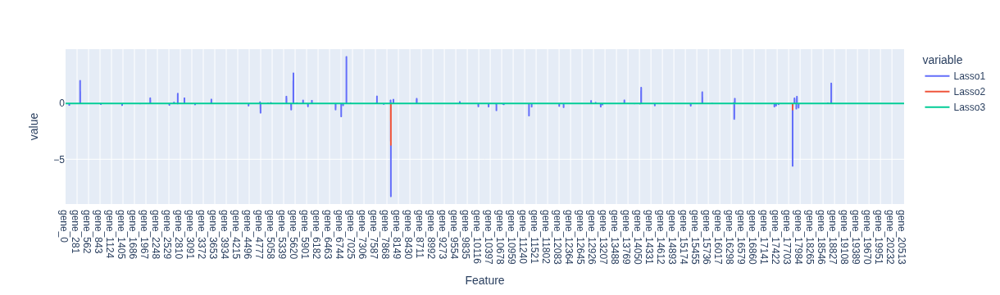

In [45]:
fig = px.line(coefficients_lasso, x = 'Feature', y = ['Lasso1', 'Lasso2', 'Lasso3'])
fig.show()

## Hyperparameter optimization
19. Use grid search to find the best value for $\alpha$, for Ridge and then for Lasso. You can test the following list of values:
* Ridge: $\alpha = $ [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100]
* Lasso: $\alpha = $ [1, 2, 3, 5, 10, 20, 30]

In [46]:
# Perform grid search
print("Grid search...")
regressor = Ridge()
# Grid of values to be tested
params = {
    'alpha': [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 50, 100]
}
best_ridge = GridSearchCV(regressor, param_grid = params, cv = 5) # cv : the number of folds to be used for CV
best_ridge.fit(X_train, Y_train)
print("...Done.")
print("Best hyperparameters : ", best_ridge.best_params_)
print("Best R2 score : ", best_ridge.best_score_)


Grid search...
...Done.
Best hyperparameters :  {'alpha': 0.01}
Best R2 score :  0.9828796931032031


In [47]:
# Perform grid search
print("Grid search...")
regressor = Lasso()
# Grid of values to be tested
params = {
    'alpha': [1, 2, 3, 5, 10, 20, 30]
}
best_lasso = GridSearchCV(regressor, param_grid = params, cv = 5) # cv : the number of folds to be used for CV
best_lasso.fit(X_train, Y_train)
print("...Done.")
print("Best hyperparameters : ", best_lasso.best_params_)
print("Best R2 score : ", best_lasso.best_score_)


Grid search...
...Done.
Best hyperparameters :  {'alpha': 1}
Best R2 score :  0.97899787046442


### Comparing models
20. Display the scores on train set and test set for the best Ridge and for the best Lasso model.

In [48]:
# Print R^2 scores
print("RIDGE / R2 score on training set : ", best_ridge.score(X_train, Y_train))
print("RIDGE / R2 score on test set : ", best_ridge.score(X_test, Y_test))
print()
print("LASSO / R2 score on training set : ", best_lasso.score(X_train, Y_train))
print("LASSO / R2 score on test set : ", best_lasso.score(X_test, Y_test))


RIDGE / R2 score on training set :  0.9999999999999654
RIDGE / R2 score on test set :  0.26089351220937995

LASSO / R2 score on training set :  0.9867613949642098
LASSO / R2 score on test set :  -4.173918232648729


21. Plot the coefficients of the best Ridge and best Lasso models in the same figure. If you had to deploy a model in production, which one would you choose and why?

In [49]:
data_dict = {
    'Feature': X.columns,
    'Best_Ridge': best_ridge.best_estimator_.coef_,
    'Best_Lasso': best_lasso.best_estimator_.coef_
            }

coefficients = pd.DataFrame(data = data_dict)
coefficients.head()


,Feature,Best_Ridge,Best_Lasso
0,gene_0,-0.018820,-0.0
1,gene_1,-0.003489,-0.0
2,gene_2,-0.011201,-0.0
3,gene_3,-0.005926,0.0
4,gene_4,-0.005403,0.0


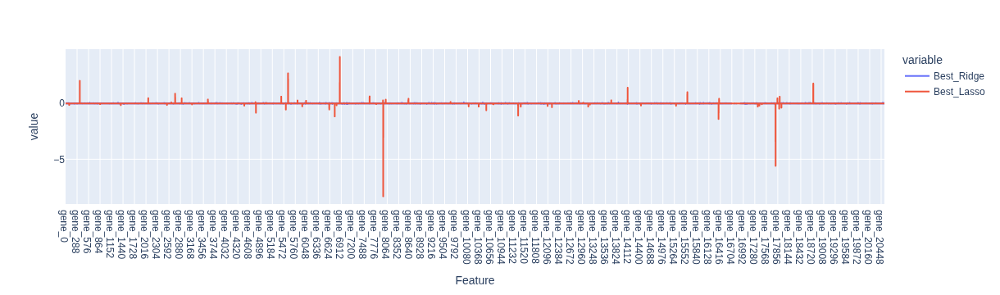

In [50]:
fig = px.line(coefficients, x = 'Feature', y = ['Best_Ridge', 'Best_Lasso'])
fig.show()


## Using Lasso as an automated feature selection method
Let's focus on the best Lasso model. Only a few features have non-zero coefficients, which means that we could train a model by including only these features, and still get the same performances.

22. Extract the names of the features that have non-zero coefficients in Lasso.

In [51]:
mask = coefficients['Best_Lasso'] != 0
best_features = coefficients.loc[mask, 'Feature'].to_list()
best_features


['gene_91',
 'gene_357',
 'gene_864',
 'gene_1384',
 'gene_1825',
 'gene_2073',
 'gene_2542',
 'gene_2655',
 'gene_2745',
 'gene_2747',
 'gene_2910',
 'gene_3170',
 'gene_3569',
 'gene_4481',
 'gene_4762',
 'gene_4773',
 'gene_4956',
 'gene_5027',
 'gene_5407',
 'gene_5523',
 'gene_5578',
 'gene_5663',
 'gene_5815',
 'gene_5934',
 'gene_6030',
 'gene_6611',
 'gene_6748',
 'gene_6795',
 'gene_6876',
 'gene_6976',
 'gene_7623',
 'gene_7790',
 'gene_7958',
 'gene_7964',
 'gene_8027',
 'gene_8594',
 'gene_8598',
 'gene_9652',
 'gene_10106',
 'gene_10357',
 'gene_10548',
 'gene_10707',
 'gene_10731',
 'gene_11346',
 'gene_11351',
 'gene_11412',
 'gene_11494',
 'gene_12086',
 'gene_12194',
 'gene_12866',
 'gene_12978',
 'gene_13103',
 'gene_13147',
 'gene_13681',
 'gene_13928',
 'gene_14062',
 'gene_14092',
 'gene_14426',
 'gene_15306',
 'gene_15514',
 'gene_15589',
 'gene_15830',
 'gene_16352',
 'gene_16372',
 'gene_16385',
 'gene_17287',
 'gene_17354',
 'gene_17397',
 'gene_17457',
 'gene_

23. Filter the feature matrix X to keep only these features, make a new train/test splitting from this X matrix and do the preprocessing once again

In [52]:
X = X.loc[:, best_features]
X.head()


,gene_91,gene_357,gene_864,gene_1384,gene_1825,gene_2073,gene_2542,gene_2655,gene_2745,gene_2747,...,gene_17354,gene_17397,gene_17457,gene_17801,gene_17847,gene_17892,gene_17905,gene_17947,gene_18663,gene_18746
0,4.228857,0.000000,0.000000,6.909077,8.488049,7.025970,9.383510,9.148459,9.958590,3.877077,...,10.543564,5.511901,8.141964,8.803453,3.105561,0.0,0.000000,12.365904,0.000000,7.689285
1,3.137061,0.000000,1.004394,6.058490,9.616554,8.614231,8.724715,8.858941,9.468192,2.530820,...,10.294173,2.466601,6.053035,5.374883,0.323658,0.0,0.000000,14.094201,0.000000,8.292989
2,0.452595,0.452595,0.000000,11.596180,8.160950,7.202535,8.532282,8.390565,12.079681,0.452595,...,10.946307,0.796598,8.010332,1.074163,3.065210,0.0,0.000000,11.461280,0.452595,10.833428
3,3.696094,0.000000,4.737725,12.718734,7.867483,8.331741,8.896696,9.807848,11.566901,2.175652,...,10.183586,2.728704,5.776733,5.785961,5.060251,0.0,0.000000,13.686227,0.000000,9.562801
4,2.544139,3.208502,0.000000,3.335812,7.211917,9.977938,7.746669,9.898096,9.547026,8.711374,...,9.273817,0.889707,3.927290,1.435949,6.322429,0.0,12.010059,9.842449,0.000000,14.439409


In [53]:
# Divide dataset Train set & Test set
print("Dividing into train and test sets...")
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)
print("...Done.")
print()


Dividing into train and test sets...
...Done.



In [54]:
# Create scaler for numeric features
scaler = StandardScaler()

# Preprocessings on train set
print("Performing preprocessings on train set...")
print(X_train.head())
X_train = scaler.fit_transform(X_train)
print('...Done.')
print(X_train[0:5]) # MUST use this syntax because X_train is a numpy array and not a pandas DataFrame anymore
print()

# Preprocessings on test set
print("Performing preprocessings on test set...")
print(X_test.head())
X_test = scaler.transform(X_test) # Don't fit again !!
print('...Done.')
print(X_test[0:5,:]) # MUST use this syntax because X_test is a numpy array and not a pandas DataFrame anymore
print()


Performing preprocessings on train set...
      gene_91   gene_357  gene_864  gene_1384  gene_1825  gene_2073  \
364  4.337162   0.000000  2.125056   6.481825   8.793906   6.615035   
458  7.457840   0.000000  1.594978   5.130033   7.665961   6.724500   
76   1.440686  10.392221  0.000000   5.664523   7.447877   9.570061   
64   0.444349   0.444349  0.783582   7.464913   8.575755   7.161112   
638  0.333996  10.237043  0.000000   3.375470   8.082894   8.899227   

     gene_2542  gene_2655  gene_2745  gene_2747  ...  gene_17354  gene_17397  \
364   8.910814   9.405637   9.851234   3.269856  ...   10.498580    7.343257   
458   8.575914   8.778718   9.575299   2.951644  ...    9.938793    5.619542   
76    8.668584   9.050831  10.922577   6.818557  ...    9.478543    2.807540   
64    9.315027   9.186951  10.535888   2.508251  ...    9.852433    3.878461   
638   7.602083  10.065632   9.377816  11.303256  ...    8.939588    1.029983   

     gene_17457  gene_17801  gene_17847  gene_1789

24. Train a NON-regularized linear regression and evaluate the performances. What do you think of the result?

In [57]:
from sklearn.linear_model import LinearRegression
# Train linear regression (no regularization)
print("Train model...")
regressor = LinearRegression()
regressor.fit(X_train, Y_train)
print("...Done.")


Train model...
...Done.


In [58]:
# Print R^2 scores
print("R2 score on training set : ", regressor.score(X_train, Y_train))
print("R2 score on test set : ", regressor.score(X_test, Y_test))


R2 score on training set :  0.9932233461018927
R2 score on test set :  0.9872428628966333
